# Transformata Fouriera

## Potrzebne importy

In [1]:
using Plots
using FFTW
using WAV

## Zadanie 1
Zamień sygnał na sumę sygnałów np.

`x = sin.(2*pi*t*200) + 2* sin.(2*pi*t*400)`

Zaobserwuj wynik transformaty i wyjaśnij go.

In [2]:
fs = 1024 # częstotliwość próbkowania
t = 0:1/(fs-1):1
x = sin.(2 * π * t * 200) + 2 * sin.(2 * π * t * 400)
y = fft(x);

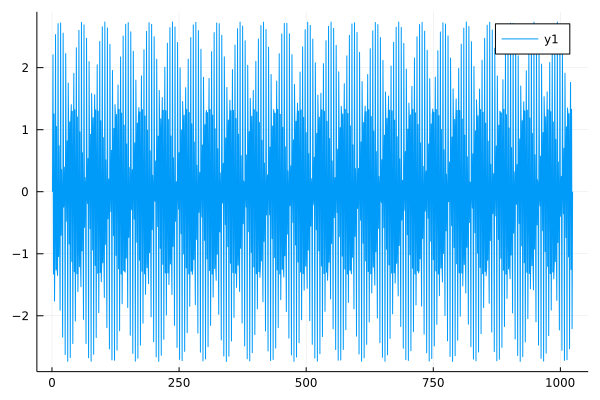

In [3]:
plot(x)

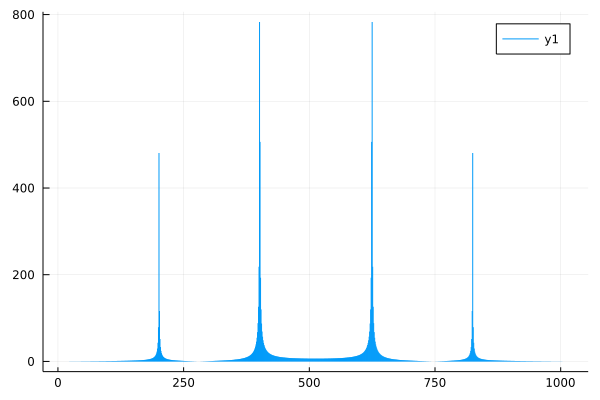

In [4]:
sticks((abs.(y)))

## Zadanie 2
Usuwanie szumów:
1. Wypełniamy tablicę wartościami funkcji cosinus ("sygnału") zaburzonej niewielkim "szumem" np. dodając do każdej wartości wylosowaną liczbę funkcją rand().
2. Proszę narysować wykres zaszumionej funkcji.
3. Narysować wykres transformaty Fouriera (widmo) tego sygnału (jak poprzednio).
4. Po transformacie wyzerowac w widmie wszystkie elementy, których wartość bezwzględna jest mniejsza niz 50. W ten sposób usuwamy "szumy" z sygnału. 
5. Przeprowadzić odwrotną transformatę funkcją ifft(). 
6. Narysować wykres otrzymanej funkcji dla częsci rzeczywistej. 
7. Porównać z wejściowym wykresem sygnału.

In [5]:
fs = 1024 # częstotliwość próbkowania
t = 0:1/(fs-1):1
xx = cos.(50* t .+.2).^2 .+ rand(length(t))/5

1024-element Vector{Float64}:
 1.01491211251291
 1.136102963011229
 0.9568863916875398
 0.9900502425252067
 0.8519964303480334
 0.8999595480735767
 0.8331750155961778
 0.9221722882693721
 0.7540058161336632
 0.6940405163662171
 0.6073006730184615
 0.5953959260324357
 0.6310352812191942
 ⋮
 0.8088858307510274
 0.7756697777084398
 0.7686987268769897
 0.8311599045687487
 0.9330007010885321
 1.016987440166562
 1.0159933687649092
 1.0692677280815457
 0.962581801970075
 1.009514597202227
 1.0480186728909333
 1.0033671001204891

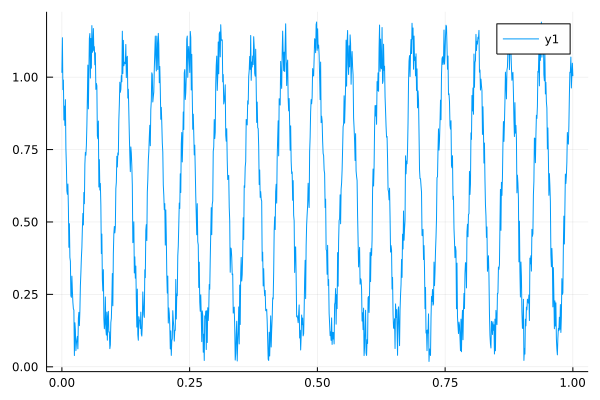

In [6]:
plot(t, xx)

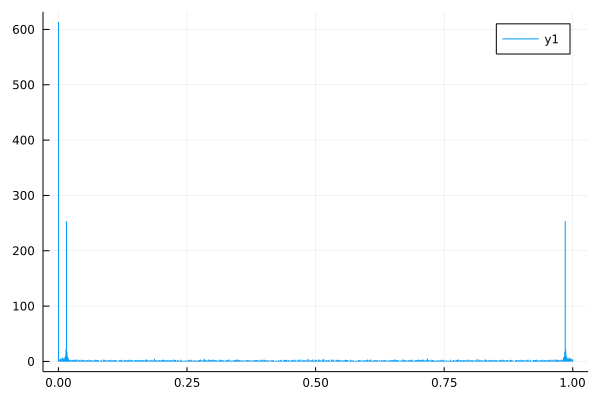

In [7]:
yy = fft(xx)
sticks(t, abs.(yy))

In [8]:
yy = ComplexF64[abs(y) < 50 ? (0 + 0im) : y for y ∈ yy];

In [9]:
ix = ifft(yy)

1024-element Vector{ComplexF64}:
 1.0862158770773243 + 0.0im
 1.0750682361218462 - 1.5250021867624709e-19im
 1.0593361232590537 - 1.4400564630952158e-18im
 1.0391710473358626 - 3.3103736588161574e-17im
 1.0147672090567654 - 4.638315544645933e-17im
 0.9863596307248843 - 1.6024479773221022e-19im
 0.9542218928487181 - 3.19119812939539e-17im
  0.918663499412288 + 2.1872029932897054e-17im
 0.8800268971825824 + 7.909209053473409e-18im
 0.8386841777599886 + 1.1498916065911456e-17im
 0.7950334941327755 - 1.602494111414523e-17im
 0.7494952262461638 - 1.9624017108080223e-17im
 0.7025079325136513 - 4.253923808876717e-18im
                    ⋮
 0.8684326786069394 + 2.2980296798376253e-17im
 0.9078844498536094 + 3.3423733151700084e-18im
 0.9443618204466815 + 2.8526237241405557e-18im
 0.9775134933667857 - 3.843345321834864e-17im
 1.0070201998811534 + 4.087410222748265e-17im
 1.0325977742760446 + 7.701400162876753e-17im
 1.0539998905279124 + 4.331819373056403e-17im
 1.0710204345576642 + 7.4560908462

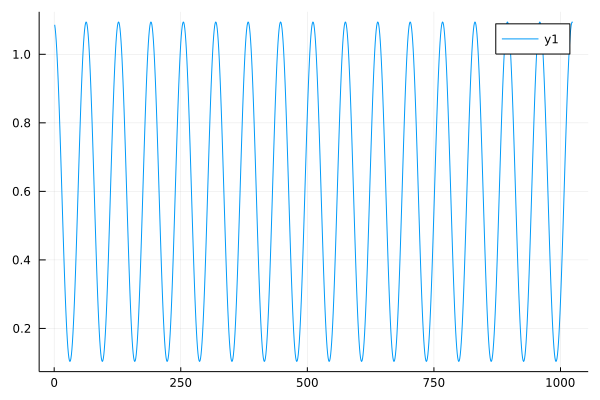

In [10]:
plot(real.(ix))

## Zadanie 3
Proszę nagrać własny glos i zastosować na nim trasformatę Fouriera, narysować wykres widma. Następnie poeksperymentować (wyciąć wybrane częstotliwości), dokonać odwrotnej transformaty i odsłuchać efekt.

W ćwiczeniu będę wykorzystywać pakiet WAV, który uzupełnię o dodatkowe funkcje, które mi sie później przydadzą.

1. `wavplot` -- tworzy wykresy dla obydwu pasm; istnieje również możliwość plotowania transformaty
2. `wavapply` -- aplikuje zadaną funkcję na transformacie, konwertując plik zgodnie z nią
3. `wavapplycompare` -- porównuje dodatkowo wersje: sprzed konwersji i po konwersji
4. `wavtrim` -- obniża sygnał, eliminując częściowo szum

In [11]:
function wavplot(s, fs; step=nothing, plottype=plot, kwargs...)
    tt = collect(0:1/fs:(size(s)[1]-1)/fs)
    if !isnothing(step)
        tt = tt[1:step:end]
        s = s[1:step:end, :]
    end
    plottype(tt, s, xlabel="Time [s]", size=(800, 600), layout=(2,1), kwargs...)
end

wavplot (generic function with 1 method)

In [12]:
function wavapply(s, fs, f)
    yy = fft(s)
    yy[:, 1] = f.(yy[:, 1])
    real.(ifft(yy)), fs
end

wavapply (generic function with 1 method)

In [13]:
function wavapplycompare(s, fs, f)
    wavplay(s, fs)
    s, fs = wavapply(s, fs, f)
    wavplay(s, fs)
    s, fs
end

wavapplycompare (generic function with 1 method)

In [14]:
function wavtrim(s, fs; gate=0.005)
    f = x -> abs(x) < gate ? 0 : x > 0 ? x - gate : x + gate
    f.(s), fs
end

wavtrim (generic function with 1 method)

Wczytajmy, odsłuchajmy i wyrysujmy plik wejściowy:

In [38]:
s, fs = wavread("pan_tadeusz.wav")
wavplay(s, fs)
wavplot(s, fs)

Policzmy i wyrysujmy szybką transformację Fouriera:

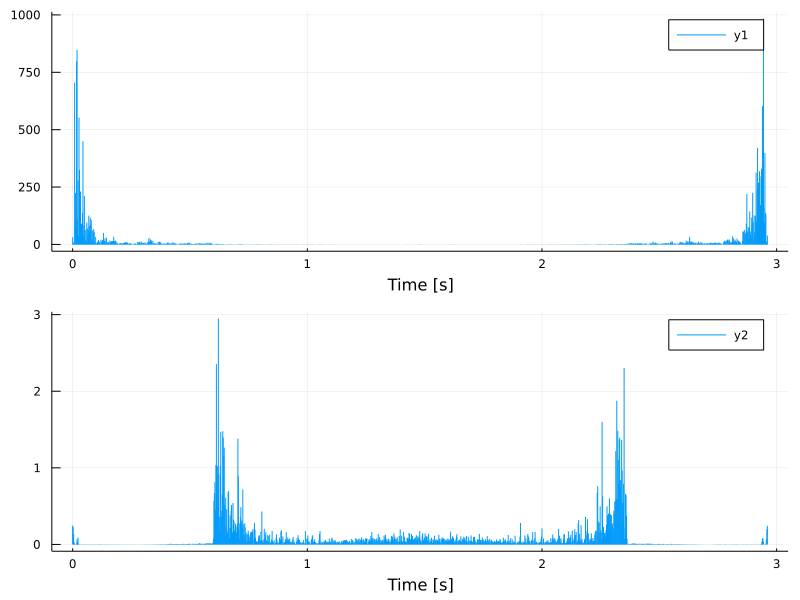

In [39]:
yy = fft(s)
wavplot(abs.(yy), fs; plottype=sticks, step=100)

Usuńmy szumy poprzez zredukowanie do zera wartości mniejszych od 50.

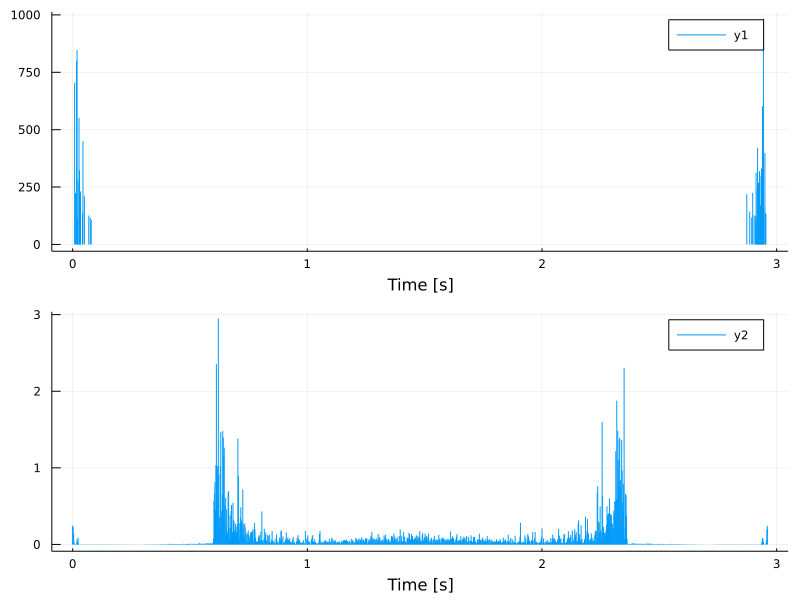

In [40]:
yy[:,1] = ComplexF64[abs(y) < 100 ? (0 + 0im) : y for y ∈ yy[:, 1]]
wavplot(abs.(yy), fs; plottype=sticks, step=100)

Obliczmy odwrotność transformacji. Następnie odsłuchajmy i wyrysujmy poprawiony sygnał.

In [41]:
is = real.(ifft(yy))
wavplay(is, fs)
wavplot(is, fs) 

Przekonwertowaną ścieżkę dźwiękową możemy zapisać do pliku

In [19]:
wavwrite(real.(is), "processed.wav", Fs=fs)

Zastosujmy kilka różnych funkcji na transformacie Fouriera

In [20]:
s, fs = wavread("pan_tadeusz.wav");

In [42]:
wavapplycompare(s, fs, x -> 5 * x);

In [43]:
wavapplycompare(s, fs, x -> abs(x) < 100 ? 0 : x);

In [44]:
wavapplycompare(s, fs, x -> x / 4 * log(abs(x)+1));

In [45]:
wavapplycompare(s, fs, x -> 10 * sqrt(x));

In [46]:
wavapplycompare(s, fs, x -> 1/2 * x);

In [47]:
wavplay(s, fs / 2);

In [49]:
wavplay(s, fs * 2);

In [50]:
wavplay(wavtrim(s, fs; gate=0.005)...)

In [29]:
wavplot(s, fs)